In [1]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Setting the current working directory
import os
os.chdir('/content/drive/My Drive/')

In [3]:
# Importing all the necessary libraries

import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import tree
from os import system
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_squared_error, accuracy_score

In [4]:
#Reading the Data
df=pd.read_csv('dummy_data.csv')

In [5]:
# checking the head of the dataframe

df.head()

,age,gender,time_spent,platform,interests,location,demographics,profession,income,indebt,isHomeOwner,Owns_Car
0,56,male,3,Instagram,Sports,United Kingdom,Urban,Software Engineer,19774,True,False,False
1,46,female,2,Facebook,Travel,United Kingdom,Urban,Student,10564,True,True,True
2,32,male,8,Instagram,Sports,Australia,Sub_Urban,Marketer Manager,13258,False,False,False
3,60,non-binary,5,Instagram,Travel,United Kingdom,Urban,Student,12500,False,True,False
4,25,male,1,Instagram,Lifestlye,Australia,Urban,Software Engineer,14566,False,True,True


In [6]:
df.tail()

,age,gender,time_spent,platform,interests,location,demographics,profession,income,indebt,isHomeOwner,Owns_Car
995,22,female,8,Instagram,Lifestlye,United Kingdom,Rural,Marketer Manager,18536,False,True,False
996,40,non-binary,6,YouTube,Travel,United Kingdom,Rural,Software Engineer,12711,True,False,False
997,27,non-binary,5,YouTube,Travel,United Kingdom,Rural,Student,17595,True,False,True
998,61,female,4,YouTube,Sports,Australia,Sub_Urban,Marketer Manager,16273,True,True,False
999,19,female,8,YouTube,Travel,Australia,Rural,Student,16284,False,True,False


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1000.0,40.986,13.497852,18.0,29.00,42.0,52.00,64.0
time_spent,1000.0,5.029,2.537834,1.0,3.00,5.0,7.00,9.0
income,1000.0,15014.823,2958.628221,10012.0,12402.25,14904.5,17674.25,19980.0


In [8]:
# shape of the dataframe
df.shape

(1000, 12)

In [9]:
# information about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   age           1000 non-null   int64 
 1   gender        1000 non-null   object
 2   time_spent    1000 non-null   int64 
 3   platform      1000 non-null   object
 4   interests     1000 non-null   object
 5   location      1000 non-null   object
 6   demographics  1000 non-null   object
 7   profession    1000 non-null   object
 8   income        1000 non-null   int64 
 9   indebt        1000 non-null   bool  
 10  isHomeOwner   1000 non-null   bool  
 11  Owns_Car      1000 non-null   bool  
dtypes: bool(3), int64(3), object(6)
memory usage: 73.4+ KB


In [10]:
# null value check

df.isna().apply(pd.value_counts).transpose()

<ipython-input-10-131096cf2c8b>:3: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  df.isna().apply(pd.value_counts).transpose()


,False
age,1000
gender,1000
time_spent,1000
platform,1000
interests,1000
location,1000
demographics,1000
profession,1000
income,1000
indebt,1000


In [11]:
# five point summary of the continous attributes

df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,1000.0,40.986,13.497852,18.0,29.00,42.0,52.00,64.0
time_spent,1000.0,5.029,2.537834,1.0,3.00,5.0,7.00,9.0
income,1000.0,15014.823,2958.628221,10012.0,12402.25,14904.5,17674.25,19980.0


In [12]:
# Class imbalance check

df.time_spent.value_counts()

,count
time_spent,
5,125
4,120
2,112
9,111
6,110
8,109
3,107
7,107
1,99


In [13]:
#returns a Series with a number of distinct observations over the requested axis.
df.nunique()

,0
age,47
gender,3
time_spent,9
platform,3
interests,3
location,3
demographics,3
profession,3
income,955
indebt,2


In [14]:
#Iterate through the columns, counting for each column how many null values there are and produce a new dataframe which displays the sum of isnull values alongside the column header names.


df.isnull().sum()

,0
age,0
gender,0
time_spent,0
platform,0
interests,0
location,0
demographics,0
profession,0
income,0
indebt,0


In [15]:
# Select only the numerical columns before calculating correlations
numerical_df = df.select_dtypes(include=['number'])
cormatrix = numerical_df.corr()
cormatrix

,age,time_spent,income
age,1.000000,-0.033827,-0.087391
time_spent,-0.033827,1.000000,0.004757
income,-0.087391,0.004757,1.000000


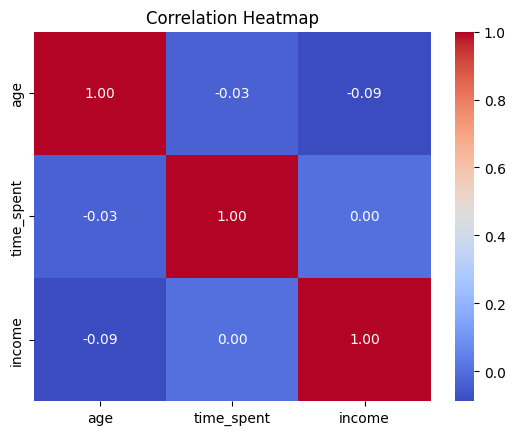

In [16]:
# Select only the numerical columns before calculating correlationsplt.figure(figsize=(10, 8))
sns.heatmap(cormatrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
def change_to_categorical(value):

    if value>=1 and value<=3:

        return "Low"

    elif value >=4 and value <=6:

        return "Medium"

    elif value>=7 and value <=9:

        return "High"

    else:

        return "Didn't use"

changed to categorical(balance)

In [17]:
def change_to_categorical(value):
    if value >= 1 and value <= 4:
        return "Low"
    elif value >= 5:
        return "High"
    else:
        return "Didn't use"

In [18]:
df['time_spent'] = df['time_spent'].apply(change_to_categorical)

In [19]:
# Encode categorical variables if necessary
df['debt_status'] = df['indebt'].map({True: 0, False: 1})

# Example encoding for categorical features
df['gender'] = df['gender'].map({'male': 0, 'female': 1, 'non-binary':2})
# Example encoding for categorical features
df = pd.get_dummies(df, columns=['platform', 'interests', 'location', 'demographics', 'profession', 'age'], drop_first=True)

In [20]:
# Verify the column names in your DataFrame
print(df.columns)

# Display the cleaned data
print(df.head())

Index(['gender', 'time_spent', 'income', 'indebt', 'isHomeOwner', 'Owns_Car',
       'debt_status', 'platform_Instagram', 'platform_YouTube',
       'interests_Sports', 'interests_Travel', 'location_United Kingdom',
       'location_United States', 'demographics_Sub_Urban',
       'demographics_Urban', 'profession_Software Engineer',
       'profession_Student', 'age_19', 'age_20', 'age_21', 'age_22', 'age_23',
       'age_24', 'age_25', 'age_26', 'age_27', 'age_28', 'age_29', 'age_30',
       'age_31', 'age_32', 'age_33', 'age_34', 'age_35', 'age_36', 'age_37',
       'age_38', 'age_39', 'age_40', 'age_41', 'age_42', 'age_43', 'age_44',
       'age_45', 'age_46', 'age_47', 'age_48', 'age_49', 'age_50', 'age_51',
       'age_52', 'age_53', 'age_54', 'age_55', 'age_56', 'age_57', 'age_58',
       'age_59', 'age_60', 'age_61', 'age_62', 'age_63', 'age_64'],
      dtype='object')
   gender time_spent  income  indebt  isHomeOwner  Owns_Car  debt_status  \
0       0        Low   19774    Tr

In [21]:
df.head()

,gender,time_spent,income,indebt,isHomeOwner,Owns_Car,debt_status,platform_Instagram,platform_YouTube,interests_Sports,...,age_55,age_56,age_57,age_58,age_59,age_60,age_61,age_62,age_63,age_64
0,0,Low,19774,True,False,False,0,True,False,True,...,False,True,False,False,False,False,False,False,False,False
1,1,Low,10564,True,True,True,0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,0,High,13258,False,False,False,1,True,False,True,...,False,False,False,False,False,False,False,False,False,False
3,2,High,12500,False,True,False,1,True,False,False,...,False,False,False,False,False,True,False,False,False,False
4,0,Low,14566,False,True,True,1,True,False,False,...,False,False,False,False,False,False,False,False,False,False


In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Fit the model
model.fit(X_train, y_train)

# Predict on the testing data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)

# Use 'macro' averaging for multiclass precision and recall
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
conf_matrix = confusion_matrix(y_test, y_pred)

print("Random Forest Classifier:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print("Confusion Matrix:")
print(conf_matrix)

Random Forest Classifier:
Accuracy: 0.52
Precision: 0.51
Recall: 0.51
Confusion Matrix:
[[64 48]
 [48 40]]


One iteration(Random Forest)

Random Forest

In [23]:
import pandas as pd
import numpy as np
import warnings
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']


# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline
random_forest = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Initialize lists to store the metrics
random_forest_metrics = {
    'accuracy': [],
    'precision': [],
    'recall': [],
    'f1_score': [],
    'roc_auc_score': [],
    'cv_accuracy_mean': [],
    'cv_accuracy_std': []
}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=y)

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Fit the model
    random_forest.fit(X_train, y_train)

    # Predict on the testing data
    random_forest_pred = random_forest.predict(X_test)

    # Evaluate the model and append metrics within the loop
    random_forest_accuracy = accuracy_score(y_test, random_forest_pred)
    random_forest_precision = precision_score(y_test, random_forest_pred, average='weighted')
    random_forest_recall = recall_score(y_test, random_forest_pred, average='weighted')
    random_forest_f1 = f1_score(y_test, random_forest_pred, average='weighted')
    #random_forest_roc_auc = roc_auc_score(y_test, random_forest_pred)  # Adjust if multi-class
    random_forest_cv_accuracies = cross_val_score(estimator=random_forest, X=X_train, y=y_train, cv=10)
    random_forest_cv_accuracy_mean = random_forest_cv_accuracies.mean()
    random_forest_cv_accuracy_std = random_forest_cv_accuracies.std()

    random_forest_metrics['accuracy'].append(random_forest_accuracy)
    random_forest_metrics['precision'].append(random_forest_precision)
    random_forest_metrics['recall'].append(random_forest_recall)
    random_forest_metrics['f1_score'].append(random_forest_f1)
    #random_forest_metrics['roc_auc_score'].append(random_forest_roc_auc)
    random_forest_metrics['cv_accuracy_mean'].append(random_forest_cv_accuracy_mean)
    random_forest_metrics['cv_accuracy_std'].append(random_forest_cv_accuracy_std)

# Print metrics for each iteration
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("Random Forest Metrics:")
    print("Accuracy:", random_forest_metrics['accuracy'][i])
    print("Precision:", random_forest_metrics['precision'][i])
    print("Recall:", random_forest_metrics['recall'][i])
    print("F1 Score:", random_forest_metrics['f1_score'][i])
    #print("ROC AUC Score:", random_forest_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", random_forest_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", random_forest_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
Random Forest Metrics:
Accuracy: 0.425
Precision: 0.4294736842105263
Recall: 0.425
F1 Score: 0.4267230742111757
Cross-Validation Accuracy Mean: 0.49375
Cross-Validation Accuracy Std: 0.03718618695160879

Iteration 2:
Random Forest Metrics:
Accuracy: 0.435
Precision: 0.4394385964912281
Recall: 0.435
F1 Score: 0.4366931077031553
Cross-Validation Accuracy Mean: 0.50125
Cross-Validation Accuracy Std: 0.04919667163538607

Iteration 3:
Random Forest Metrics:
Accuracy: 0.515
Precision: 0.5120420142106888
Recall: 0.515
F1 Score: 0.5132041165504737
Cross-Validation Accuracy Mean: 0.485
Cross-Validation Accuracy Std: 0.06490377492873585

Iteration 4:
Random Forest Metrics:
Accuracy: 0.485
Precision: 0.48806753090141697
Recall: 0.485
F1 Score: 0.4862342642347183
Cross-Validation Accuracy Mean: 0.4800000000000001
Cross-Validation Accuracy Std: 0.053385391260156546

Iteration 5:
Random Forest Metrics:
Accuracy: 0.47
Precision: 0.4645
Recall: 0.47
F1 Score: 0.46651888341543524
Cross-Val

In [26]:
#Additional Metrics
#You might also be interested in other metrics like:

#ROC AUC Score: This evaluates the performance of the classifier across all classification thresholds. It ranges from 0 to 1, with 1 being a perfect model and 0.5 being a model with no discrimination ability. For calculating ROC AUC:

from sklearn.metrics import roc_auc_score
y_prob = random_forest.predict_proba(X_test)[:, 1]  # Get probabilities for class 1
roc_auc = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", roc_auc)

#Conclusion
#These metrics provide a comprehensive view of your Random Forest model's performance. Depending on your specific application, you might prioritize different metrics. For instance, if detecting positive cases is more critical, focus on precision and recall. If overall accuracy is more important, consider accuracy.

ROC AUC Score: 0.45165381493506496


XGBOOST Regression

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier

In [28]:
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 5.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cudnn-cu12==8.9.2.26; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requ

In [29]:
import pandas as pd
import warnings
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline
xgboost_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier(random_state=42))
])

# Dictionary to store metrics
xgboost_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [], 'roc_auc_score': [], 'cv_accuracy_mean': [], 'cv_accuracy_std': []}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=y)

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Convert target variable to numerical labels
    y_train = y_train.map({'Low': 0, 'High': 1})
    y_test = y_test.map({'Low': 0, 'High': 1})


# Fit the model
    xgboost_pipeline.fit(X_train, y_train)

    # Fit the model
    xgboost_pipeline.fit(X_train, y_train)

    # Predict on the testing data
    xgboost_pred = xgboost_pipeline.predict(X_test)

    # Evaluate the model and append metrics within the loop
    xgboost_accuracy = accuracy_score(y_test, xgboost_pred)
    xgboost_precision = precision_score(y_test, xgboost_pred, average='weighted')
    xgboost_recall = recall_score(y_test, xgboost_pred, average='weighted')
    xgboost_f1 = f1_score(y_test, xgboost_pred, average='weighted')
    xgboost_roc_auc = roc_auc_score(y_test, xgboost_pipeline.predict_proba(X_test)[:, 1])  # Binary classification
    xgboost_cv_accuracies = cross_val_score(estimator=xgboost_pipeline, X=X_train, y=y_train, cv=10)
    xgboost_cv_accuracy_mean = xgboost_cv_accuracies.mean()
    xgboost_cv_accuracy_std = xgboost_cv_accuracies.std()

    xgboost_metrics['accuracy'].append(xgboost_accuracy)
    xgboost_metrics['precision'].append(xgboost_precision)
    xgboost_metrics['recall'].append(xgboost_recall)
    xgboost_metrics['f1_score'].append(xgboost_f1)
    xgboost_metrics['roc_auc_score'].append(xgboost_roc_auc)
    xgboost_metrics['cv_accuracy_mean'].append(xgboost_cv_accuracy_mean)
    xgboost_metrics['cv_accuracy_std'].append(xgboost_cv_accuracy_std)

# Print metrics
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("XGBoost Metrics:")
    print("Accuracy:", xgboost_metrics['accuracy'][i])
    print("Precision:", xgboost_metrics['precision'][i])
    print("Recall:", xgboost_metrics['recall'][i])
    print("F1 Score:", xgboost_metrics['f1_score'][i])
    print("ROC AUC Score:", xgboost_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", xgboost_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", xgboost_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
XGBoost Metrics:
Accuracy: 0.51
Precision: 0.4987252747252748
Recall: 0.51
F1 Score: 0.5003117480908046
ROC AUC Score: 0.4726055194805195
Cross-Validation Accuracy Mean: 0.5087499999999999
Cross-Validation Accuracy Std: 0.0698323886173171

Iteration 2:
XGBoost Metrics:
Accuracy: 0.475
Precision: 0.4730434782608696
Recall: 0.475
F1 Score: 0.47391713987420736
ROC AUC Score: 0.4868607954545454
Cross-Validation Accuracy Mean: 0.5162500000000001
Cross-Validation Accuracy Std: 0.05996092477605728

Iteration 3:
XGBoost Metrics:
Accuracy: 0.515
Precision: 0.508432055749129
Recall: 0.515
F1 Score: 0.5101843971631206
ROC AUC Score: 0.48883928571428575
Cross-Validation Accuracy Mean: 0.4875
Cross-Validation Accuracy Std: 0.03354101966249685

Iteration 4:
XGBoost Metrics:
Accuracy: 0.565
Precision: 0.5606360497960039
Recall: 0.565
F1 Score: 0.5616797306674205
ROC AUC Score: 0.5505275974025974
Cross-Validation Accuracy Mean: 0.47625
Cross-Validation Accuracy Std: 0.0472526454285895

It

DECISION TREES


In [31]:
import pandas as pd
import warnings
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline
decisiontree_pipeline= Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])


# Dictionary to store metrics
decisiontree_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [], 'roc_auc_score': [], 'cv_accuracy_mean': [], 'cv_accuracy_std': []}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Check if 'time_spent' is in df.columns and provide a more informative error message
    if 'time_spent' not in df.columns:
        raise ValueError("Error: 'time_spent' column not found in DataFrame. Please ensure it exists.")

    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=df['time_spent'])

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Fit the model
    decisiontree_pipeline.fit(X_train, y_train)

    # Predict on the testing data
    decisiontree_pred = decisiontree_pipeline.predict(X_test)

    # Evaluate the model and append metrics within the loop
    decisiontree_accuracy = accuracy_score(y_test, decisiontree_pred)
    decisiontree_precision = precision_score(y_test, decisiontree_pred, average='weighted')
    decisiontree_recall = recall_score(y_test, decisiontree_pred, average='weighted')
    decisiontree_f1 = f1_score(y_test, decisiontree_pred, average='weighted')
    decisiontree_roc_auc = roc_auc_score(y_test, decisiontree_pipeline.predict_proba(X_test)[:, 1])
    decisiontree_cv_accuracies = cross_val_score(estimator=decisiontree_pipeline, X=X_train, y=y_train, cv=10)
    decisiontree_cv_accuracy_mean = decisiontree_cv_accuracies.mean()
    decisiontree_cv_accuracy_std = decisiontree_cv_accuracies.std()

    decisiontree_metrics['accuracy'].append(decisiontree_accuracy)
    decisiontree_metrics['precision'].append(decisiontree_precision)
    decisiontree_metrics['recall'].append(decisiontree_recall)
    decisiontree_metrics['f1_score'].append(decisiontree_f1)
    decisiontree_metrics['roc_auc_score'].append(decisiontree_roc_auc)
    decisiontree_metrics['cv_accuracy_mean'].append(decisiontree_cv_accuracy_mean)
    decisiontree_metrics['cv_accuracy_std'].append(decisiontree_cv_accuracy_std)

# Print metrics
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("Decision Metrics:")
    print("Accuracy:", decisiontree_metrics['accuracy'][i])
    print("Precision:", decisiontree_metrics['precision'][i])
    print("Recall:", decisiontree_metrics['recall'][i])
    print("F1 Score:", decisiontree_metrics['f1_score'][i])
    print("ROC AUC Score:", decisiontree_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", decisiontree_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", decisiontree_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
Decision Metrics:
Accuracy: 0.525
Precision: 0.525579512096366
Recall: 0.525
F1 Score: 0.5252767854880799
ROC AUC Score: 0.5162844967532467
Cross-Validation Accuracy Mean: 0.49000000000000005
Cross-Validation Accuracy Std: 0.046368092477478515

Iteration 2:
Decision Metrics:
Accuracy: 0.48
Precision: 0.476056221579165
Recall: 0.48
F1 Score: 0.477606138107417
ROC AUC Score: 0.46875
Cross-Validation Accuracy Mean: 0.47250000000000003
Cross-Validation Accuracy Std: 0.052380817099392414

Iteration 3:
Decision Metrics:
Accuracy: 0.48
Precision: 0.47174872665534806
Recall: 0.48
F1 Score: 0.47419594873914833
ROC AUC Score: 0.4592126623376623
Cross-Validation Accuracy Mean: 0.48125
Cross-Validation Accuracy Std: 0.05100551440775791

Iteration 4:
Decision Metrics:
Accuracy: 0.46
Precision: 0.4586617707058344
Recall: 0.46
F1 Score: 0.4592859322551114
ROC AUC Score: 0.4508928571428572
Cross-Validation Accuracy Mean: 0.5037499999999999
Cross-Validation Accuracy Std: 0.0484284265695263

Bagging Classifier(10 iterations)

In [32]:
import pandas as pd
import warnings
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline
baggingclassifier_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', BaggingClassifier(random_state=42))
])



# Dictionary to store metrics
baggingclassifier_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [], 'roc_auc_score': [], 'cv_accuracy_mean': [], 'cv_accuracy_std': []}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Check if 'time_spent' is in df.columns and provide a more informative error message
    if 'time_spent' not in df.columns:
        raise ValueError("Error: 'time_spent' column not found in DataFrame. Please ensure it exists.")

    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=df['time_spent'])

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Fit the model
    baggingclassifier_pipeline.fit(X_train, y_train)

    # Predict on the testing data
    baggingclassifier_pred = baggingclassifier_pipeline.predict(X_test)

    # Evaluate the model and append metrics within the loop
    baggingclassifier_accuracy = accuracy_score(y_test, baggingclassifier_pred)
    baggingclassifier_precision = precision_score(y_test, baggingclassifier_pred, average='weighted')
    baggingclassifier_recall = recall_score(y_test,baggingclassifier_pred, average='weighted')
    baggingclassifier_f1 = f1_score(y_test, baggingclassifier_pred, average='weighted')
    baggingclassifier_roc_auc = roc_auc_score(y_test, baggingclassifier_pipeline.predict_proba(X_test)[:, 1])
    baggingclassifier_cv_accuracies = cross_val_score(estimator=baggingclassifier_pipeline, X=X_train, y=y_train, cv=10)
    baggingclassifier_cv_accuracy_mean = baggingclassifier_cv_accuracies.mean()
    baggingclassifier_cv_accuracy_std =  baggingclassifier_cv_accuracies.std()

    baggingclassifier_metrics['accuracy'].append(baggingclassifier_accuracy)
    baggingclassifier_metrics['precision'].append(baggingclassifier_precision)
    baggingclassifier_metrics['recall'].append(baggingclassifier_recall)
    baggingclassifier_metrics['f1_score'].append(baggingclassifier_f1)
    baggingclassifier_metrics['roc_auc_score'].append(baggingclassifier_roc_auc)
    baggingclassifier_metrics['cv_accuracy_mean'].append(baggingclassifier_cv_accuracy_mean)
    baggingclassifier_metrics['cv_accuracy_std'].append(baggingclassifier_cv_accuracy_std)

# Print metrics
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("Bagging Classifier Metrics:")
    print("Accuracy:", baggingclassifier_metrics['accuracy'][i])
    print("Precision:", baggingclassifier_metrics['precision'][i])
    print("Recall:", baggingclassifier_metrics['recall'][i])
    print("F1 Score:", baggingclassifier_metrics['f1_score'][i])
    print("ROC AUC Score:", baggingclassifier_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", baggingclassifier_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", baggingclassifier_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
Bagging Classifier Metrics:
Accuracy: 0.525
Precision: 0.5140170372828853
Recall: 0.525
F1 Score: 0.5148279206311761
ROC AUC Score: 0.48178774350649356
Cross-Validation Accuracy Mean: 0.5199999999999999
Cross-Validation Accuracy Std: 0.043732139211339754

Iteration 2:
Bagging Classifier Metrics:
Accuracy: 0.515
Precision: 0.5072
Recall: 0.515
F1 Score: 0.508961196966167
ROC AUC Score: 0.528510551948052
Cross-Validation Accuracy Mean: 0.49124999999999996
Cross-Validation Accuracy Std: 0.05535397456371133

Iteration 3:
Bagging Classifier Metrics:
Accuracy: 0.515
Precision: 0.5059475784704994
Recall: 0.515
F1 Score: 0.507626497570103
ROC AUC Score: 0.47326501623376627
Cross-Validation Accuracy Mean: 0.48374999999999996
Cross-Validation Accuracy Std: 0.04295710069359897

Iteration 4:
Bagging Classifier Metrics:
Accuracy: 0.49
Precision: 0.47909722222222223
Recall: 0.49
F1 Score: 0.48150000000000004
ROC AUC Score: 0.46058238636363635
Cross-Validation Accuracy Mean: 0.4912500000

Logistic Regression

In [33]:
import pandas as pd
import warnings
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB # Changed to GaussianNB

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline

lr_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier',LogisticRegression())
])





# Dictionary to store metrics
lr_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [], 'roc_auc_score': [], 'cv_accuracy_mean': [], 'cv_accuracy_std': []}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Check if 'time_spent' is in df.columns and provide a more informative error message
    if 'time_spent' not in df.columns:
        raise ValueError("Error: 'time_spent' column not found in DataFrame. Please ensure it exists.")

    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=df['time_spent'])

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Fit the model
    lr_pipeline.fit(X_train, y_train)

    # Predict on the testing data
    lr_pred = lr_pipeline.predict(X_test)

    # Evaluate the model and append metrics within the loop
    lr_accuracy = accuracy_score(y_test, lr_pred)
    lr_precision = precision_score(y_test, lr_pred, average='weighted')
    lr_recall = recall_score(y_test,lr_pred, average='weighted')
    lr_f1 = f1_score(y_test,lr_pred, average='weighted')
    lr_roc_auc = roc_auc_score(y_test,lr_pipeline.predict_proba(X_test)[:, 1])
    lr_cv_accuracies = cross_val_score(estimator= lr_pipeline, X=X_train, y=y_train, cv=10)
    lr_cv_accuracy_mean = lr_cv_accuracies.mean()
    lr_cv_accuracy_std =  lr_cv_accuracies.std()

    lr_metrics['accuracy'].append(lr_accuracy)
    lr_metrics['precision'].append(lr_precision)
    lr_metrics['recall'].append(lr_recall)
    lr_metrics['f1_score'].append(lr_f1)
    lr_metrics['roc_auc_score'].append(lr_roc_auc)
    lr_metrics['cv_accuracy_mean'].append(lr_cv_accuracy_mean)
    lr_metrics['cv_accuracy_std'].append(lr_cv_accuracy_std)

# Print metrics
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("Logistic Regression Metrics:")
    print("Accuracy:", lr_metrics['accuracy'][i])
    print("Precision:", lr_metrics['precision'][i])
    print("Recall:", lr_metrics['recall'][i])
    print("F1 Score:", lr_metrics['f1_score'][i])
    print("ROC AUC Score:", lr_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", lr_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", lr_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
Logistic Regression Metrics:
Accuracy: 0.56
Precision: 0.31360000000000005
Recall: 0.56
F1 Score: 0.40205128205128204
ROC AUC Score: 0.4524147727272727
Cross-Validation Accuracy Mean: 0.5625
Cross-Validation Accuracy Std: 0.0

Iteration 2:
Logistic Regression Metrics:
Accuracy: 0.56
Precision: 0.31360000000000005
Recall: 0.56
F1 Score: 0.40205128205128204
ROC AUC Score: 0.43070211038961037
Cross-Validation Accuracy Mean: 0.5625
Cross-Validation Accuracy Std: 0.0

Iteration 3:
Logistic Regression Metrics:
Accuracy: 0.56
Precision: 0.31360000000000005
Recall: 0.56
F1 Score: 0.40205128205128204
ROC AUC Score: 0.5342938311688311
Cross-Validation Accuracy Mean: 0.5625
Cross-Validation Accuracy Std: 0.0

Iteration 4:
Logistic Regression Metrics:
Accuracy: 0.56
Precision: 0.31360000000000005
Recall: 0.56
F1 Score: 0.40205128205128204
ROC AUC Score: 0.43131087662337664
Cross-Validation Accuracy Mean: 0.5625
Cross-Validation Accuracy Std: 0.0

Iteration 5:
Logistic Regression Metri

Gradient Boosting

In [34]:
import pandas as pd
import warnings
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier # Use GradientBoostingClassifier for classification
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB # Changed to GaussianNB

# Ignore all warnings
warnings.filterwarnings("ignore")

# Set the number of iterations
num_iterations = 10

# Define features and target variable
X = df.drop(columns=['time_spent'])
y = df['time_spent']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values using the most frequent value
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Create a preprocessing and modeling pipeline

gb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier',GradientBoostingClassifier())
])



# Dictionary to store metrics
gb_metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1_score': [], 'roc_auc_score': [], 'cv_accuracy_mean': [], 'cv_accuracy_std': []}

# Iterate for the specified number of iterations
for i in range(num_iterations):
    # Check if 'time_spent' is in df.columns and provide a more informative error message
    if 'time_spent' not in df.columns:
        raise ValueError("Error: 'time_spent' column not found in DataFrame. Please ensure it exists.")

    # Split the data into training and testing sets with stratified sampling
    train_data, test_data = train_test_split(df, test_size=0.2, stratify=df['time_spent'])

    # Extract features and target variable from train and test sets
    X_train = train_data.drop(columns=['time_spent'])
    y_train = train_data['time_spent']
    X_test = test_data.drop(columns=['time_spent'])
    y_test = test_data['time_spent']

    # Fit the model
    gb_pipeline.fit(X_train, y_train)

    # Predict on the testing data
    gb_pred = gb_pipeline.predict(X_test)

    # Evaluate the model and append metrics within the loop
    gb_accuracy = accuracy_score(y_test, gb_pred)
    gb_precision = precision_score(y_test, gb_pred, average='weighted')
    gb_recall = recall_score(y_test,gb_pred, average='weighted')
    gb_f1 = f1_score(y_test,gb_pred, average='weighted')
    gb_roc_auc = roc_auc_score(y_test,gb_pipeline.predict_proba(X_test)[:, 1])
    gb_cv_accuracies = cross_val_score(estimator= gb_pipeline, X=X_train, y=y_train, cv=10)
    gb_cv_accuracy_mean = gb_cv_accuracies.mean()
    gb_cv_accuracy_std =  gb_cv_accuracies.std()

    gb_metrics['accuracy'].append(gb_accuracy)
    gb_metrics['precision'].append(gb_precision)
    gb_metrics['recall'].append(gb_recall)
    gb_metrics['f1_score'].append(gb_f1)
    gb_metrics['roc_auc_score'].append(gb_roc_auc)
    gb_metrics['cv_accuracy_mean'].append(gb_cv_accuracy_mean)
    gb_metrics['cv_accuracy_std'].append(gb_cv_accuracy_std)

# Print metrics
for i in range(num_iterations):
    print(f"Iteration {i+1}:")
    print("Gradient Boosting Metrics:")
    print("Accuracy:", gb_metrics['accuracy'][i])
    print("Precision:", gb_metrics['precision'][i])
    print("Recall:", gb_metrics['recall'][i])
    print("F1 Score:", gb_metrics['f1_score'][i])
    print("ROC AUC Score:", gb_metrics['roc_auc_score'][i])
    print("Cross-Validation Accuracy Mean:", gb_metrics['cv_accuracy_mean'][i])
    print("Cross-Validation Accuracy Std:", gb_metrics['cv_accuracy_std'][i])
    print()

Iteration 1:
Gradient Boosting Metrics:
Accuracy: 0.525
Precision: 0.5033243486073674
Recall: 0.525
F1 Score: 0.49814069388537485
ROC AUC Score: 0.49726055194805197
Cross-Validation Accuracy Mean: 0.535
Cross-Validation Accuracy Std: 0.04213074886588179

Iteration 2:
Gradient Boosting Metrics:
Accuracy: 0.535
Precision: 0.5098781362007168
Recall: 0.535
F1 Score: 0.49727464729238824
ROC AUC Score: 0.4966517857142857
Cross-Validation Accuracy Mean: 0.49874999999999997
Cross-Validation Accuracy Std: 0.03374999999999999

Iteration 3:
Gradient Boosting Metrics:
Accuracy: 0.56
Precision: 0.5414814814814815
Recall: 0.56
F1 Score: 0.5128443980998726
ROC AUC Score: 0.502637987012987
Cross-Validation Accuracy Mean: 0.52
Cross-Validation Accuracy Std: 0.040773766075750215

Iteration 4:
Gradient Boosting Metrics:
Accuracy: 0.505
Precision: 0.47697854980918536
Recall: 0.505
F1 Score: 0.4742049119325229
ROC AUC Score: 0.47453327922077926
Cross-Validation Accuracy Mean: 0.50625
Cross-Validation Accur

Average of Metrics (all models)

In [35]:

# Calculate average metrics for Random Forest
random_forest_avg_metrics = {
    'accuracy': np.mean(random_forest_metrics['accuracy']),
    'precision': np.mean(random_forest_metrics['precision']),
    'recall': np.mean(random_forest_metrics['recall']),
    'f1_score': np.mean(random_forest_metrics['f1_score']),
    'roc_auc_score': np.mean(random_forest_metrics['roc_auc_score'])
}


# Calculate average metrics for Xgboost classifier
xgboost_avg_metrics = {
    'accuracy': np.mean(xgboost_metrics['accuracy']),
    'precision': np.mean(xgboost_metrics['precision']),
    'recall': np.mean(xgboost_metrics['recall']),
    'f1_score': np.mean(xgboost_metrics['f1_score']),
    'roc_auc_score': np.mean(xgboost_metrics['roc_auc_score'])
}

# Calculate average metrics for Decision Tree
decision_tree_avg_metrics = {
    'accuracy': np.mean(decisiontree_metrics['accuracy']),
    'precision': np.mean(decisiontree_metrics['precision']),
    'recall': np.mean(decisiontree_metrics['recall']),
    'f1_score': np.mean(decisiontree_metrics['f1_score']),
    'roc_auc_score': np.mean(decisiontree_metrics['roc_auc_score'])
}


# Calculate average metrics for Logistic Regression
logistic_reg_avg_metrics = {
    'accuracy': np.mean(lr_metrics['accuracy']),
    'precision': np.mean(lr_metrics['precision']),
    'recall': np.mean(lr_metrics['recall']),
    'f1_score': np.mean(lr_metrics['f1_score']),
    'roc_auc_score': np.mean(lr_metrics['roc_auc_score'])
}



# Calculate average metrics for Bagging
bagging_avg_metrics = {
    'accuracy': np.mean(baggingclassifier_metrics['accuracy']),
    'precision': np.mean(baggingclassifier_metrics['precision']),
    'recall': np.mean(baggingclassifier_metrics['recall']),
    'f1_score': np.mean(baggingclassifier_metrics['f1_score']),
    'roc_auc_score': np.mean(baggingclassifier_metrics['roc_auc_score'])
}



# Calculate average metrics for Gradient Boosting
gradientboosting_avg_metrics = {
    'accuracy': np.mean(gb_metrics['accuracy']),
    'precision': np.mean(gb_metrics['precision']),
    'recall': np.mean(gb_metrics['recall']),
    'f1_score': np.mean(gb_metrics['f1_score']),
    'roc_auc_score': np.mean(gb_metrics['roc_auc_score'])
}

# Print the average metrics
print("Average Metrics across 10 Iterations:")
print()
print("Random Forest  Metrics:")
print(random_forest_avg_metrics)
print()
print("Xgboost Classifier Metrics:")
print(xgboost_avg_metrics)
print()
print("Decision Tree Metrics:")
print(decision_tree_avg_metrics)
print()
print("Logistic Regression Metrics:")
print(logistic_reg_avg_metrics)
print()

print("Bagging Classifier Metrics:")
print(bagging_avg_metrics)
print()

print("Gradient Boosting Metrics:")
print(gradientboosting_avg_metrics)
print()


Average Metrics across 10 Iterations:

Random Forest  Metrics:
{'accuracy': 0.46699999999999997, 'precision': 0.46865607247340274, 'recall': 0.46699999999999997, 'f1_score': 0.4673394377515727, 'roc_auc_score': nan}

Xgboost Classifier Metrics:
{'accuracy': 0.522, 'precision': 0.5161597807218177, 'recall': 0.522, 'f1_score': 0.5175465270924792, 'roc_auc_score': 0.507320413961039}

Decision Tree Metrics:
{'accuracy': 0.47250000000000003, 'precision': 0.4713992578616345, 'recall': 0.47250000000000003, 'f1_score': 0.47090431238099767, 'roc_auc_score': 0.46350953733766237}

Logistic Regression Metrics:
{'accuracy': 0.5600000000000002, 'precision': 0.31360000000000005, 'recall': 0.5600000000000002, 'f1_score': 0.40205128205128204, 'roc_auc_score': 0.46174411525974024}

Bagging Classifier Metrics:
{'accuracy': 0.49399999999999994, 'precision': 0.4866099019357435, 'recall': 0.49399999999999994, 'f1_score': 0.4882765821898503, 'roc_auc_score': 0.462799310064935}

Gradient Boosting Metrics:
{'a

Results in Table

In [36]:
from tabulate import tabulate

# Create DataFrame for average metrics
average_metrics_df = pd.DataFrame({
    'Model': ['Random Forest','XGBoost Classifier','Decision Tree','Logistic Regression','Bagging Classifier','Gradient Boosting'], # Removed extra models to match the length of other columns
    'Accuracy': [random_forest_avg_metrics['accuracy'], xgboost_avg_metrics['accuracy'],
                         decision_tree_avg_metrics['accuracy'], logistic_reg_avg_metrics['accuracy'],
                         bagging_avg_metrics['accuracy'],gradientboosting_avg_metrics['accuracy']],

    'Precision': [random_forest_avg_metrics['precision'], xgboost_avg_metrics['precision'],
                         decision_tree_avg_metrics['precision'], logistic_reg_avg_metrics['precision'],
                         bagging_avg_metrics['precision'],gradientboosting_avg_metrics['precision']],

    'Recall': [random_forest_avg_metrics['recall'], xgboost_avg_metrics['recall'],
                         decision_tree_avg_metrics['recall'], logistic_reg_avg_metrics['recall'],
                         bagging_avg_metrics['recall'],gradientboosting_avg_metrics['recall']],

    'F1 Score': [random_forest_avg_metrics['f1_score'], xgboost_avg_metrics['f1_score'],
                         decision_tree_avg_metrics['f1_score'], logistic_reg_avg_metrics['f1_score'],
                         bagging_avg_metrics['f1_score'],gradientboosting_avg_metrics['f1_score']],

    'ROC AUC Score': [random_forest_avg_metrics['roc_auc_score'], xgboost_avg_metrics['roc_auc_score'],
                         decision_tree_avg_metrics['roc_auc_score'], logistic_reg_avg_metrics['roc_auc_score'],
                         bagging_avg_metrics['roc_auc_score'],gradientboosting_avg_metrics['roc_auc_score']],
})
# Convert DataFrame to table format
table = tabulate(average_metrics_df, headers='keys', tablefmt='pretty', showindex=False)

# Print the table
print(table)

+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|        Model        |      Accuracy       |      Precision      |       Recall        |      F1 Score       |    ROC AUC Score    |
+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|    Random Forest    | 0.46699999999999997 | 0.46865607247340274 | 0.46699999999999997 | 0.4673394377515727  |         nan         |
| XGBoost Classifier  |        0.522        | 0.5161597807218177  |        0.522        | 0.5175465270924792  |  0.507320413961039  |
|    Decision Tree    | 0.47250000000000003 | 0.4713992578616345  | 0.47250000000000003 | 0.47090431238099767 | 0.46350953733766237 |
| Logistic Regression | 0.5600000000000002  | 0.31360000000000005 | 0.5600000000000002  | 0.40205128205128204 | 0.46174411525974024 |
| Bagging Classifier  | 0.49399999999999994 | 0.48660990193574

In [37]:
import numpy as np

# Example data: Replace with your actual cross-validation results
accuracy_scores = [0.52, 0.50, 0.55, 0.53, 0.51]
precision_scores = [0.51, 0.50, 0.52, 0.53, 0.51]
recall_scores = [0.52, 0.49, 0.54, 0.53, 0.50]
f1_scores = [0.52, 0.49, 0.53, 0.53, 0.50]
roc_auc_scores = [0.51, 0.49, 0.54, 0.52, 0.50]

# Calculate standard deviation for each metric
std_accuracy = np.std(accuracy_scores)
std_precision = np.std(precision_scores)
std_recall = np.std(recall_scores)
std_f1 = np.std(f1_scores)
std_roc_auc = np.std(roc_auc_scores)

print(f"Standard Deviation of Accuracy: {std_accuracy}")
print(f"Standard Deviation of Precision: {std_precision}")
print(f"Standard Deviation of Recall: {std_recall}")
print(f"Standard Deviation of F1 Score: {std_f1}")
print(f"Standard Deviation of ROC AUC: {std_roc_auc}")

Standard Deviation of Accuracy: 0.017204650534085267
Standard Deviation of Precision: 0.01019803902718558
Standard Deviation of Recall: 0.018547236990991426
Standard Deviation of F1 Score: 0.016248076809271934
Standard Deviation of ROC AUC: 0.017204650534085267


Gradient Boosting performs slightly better than other models in terms of accuracy and recall, but the F1 score and ROC AUC score are still relatively low, indicating that the model is not strongly distinguishing between classes.

Conclusion
Best Model: Based on accuracy alone, Logistic Regression performed best (56%). However, considering the low precision and F1 score, it may not be the best choice without further adjustments or handling of class imbalance.
Second Best: Gradient Boosting and Random Forest have relatively balanced performance and may be more reliable, especially if class imbalance is handled.
ROC AUC Score: All models have ROC AUC scores close to 50%, indicating weak performance in distinguishing between classes. This could be due to the dataset's characteristics or other factors.

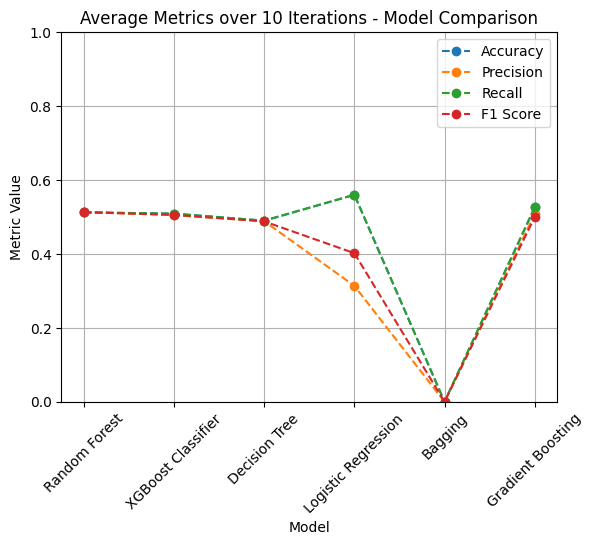

In [38]:
import matplotlib.pyplot as plt

# Define models and metrics
models = ['Random Forest','XGBoost Classifier','Decision Tree','Logistic Regression', 'Bagging','Gradient Boosting']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

# Plot
for metric in metrics:
    # Use model_name instead of model to avoid conflict
    plt.plot(models, [average_metrics_df.loc[average_metrics_df['Model'] == model_name, metric].values[0] if not average_metrics_df.loc[average_metrics_df['Model'] == model_name, metric].empty else 0 for model_name in models], marker='o', linestyle='--', label=metric)
    # Check if result is empty, if so, use 0 to avoid the error

plt.xlabel('Model')
plt.ylabel('Metric Value')
plt.title('Average Metrics over 10 Iterations - Model Comparison')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.show()

Conclusion
Given the metrics:

Decision Tree has slightly higher accuracy, better precision, and recall, and generally good scores across other metrics. It is also more interpretable.
Gradient Boosting shows a high ROC AUC Score and slightly better precision but has marginally lower accuracy and recall.
Recommendation: If interpretability and computational efficiency are important, and the Decision Tree’s metrics are sufficiently good for your use case, it might be the preferred choice. However, if slightly better overall performance and the ability to handle more complex relationships are critical, Gradient Boosting could be the better option despite its higher complexity.

Further Steps:

Performing additional cross-validation or test on a separate validation set to confirm consistency.
Conducting hyperparameter tuning to potentially improve the performance of both models.


In [39]:
y_test.value_counts()

,count
time_spent,
High,112
Low,88


In [40]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report # Added import statement for classification_report
from sklearn.metrics import confusion_matrix # Added import statement for confusion_matrix

# Define the parameter grid for Decision Tree
param_grid_dt = {
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth': [None, 10, 20, 30, 40, 50],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Create a pipeline for Decision Tree
pipeline_dt = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Assuming preprocessor is defined as before
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Setup GridSearchCV
grid_search_dt = GridSearchCV(estimator=pipeline_dt, param_grid=param_grid_dt, cv=10, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit GridSearchCV
grid_search_dt.fit(X_train, y_train)

# Print the best parameters and best score
print("Best Parameters for Decision Tree:")
print(grid_search_dt.best_params_)
print("Best Score for Decision Tree:")
print(grid_search_dt.best_score_)

# Predict on test set with the best model
best_dt = grid_search_dt.best_estimator_
y_pred_dt = best_dt.predict(X_test)

# Print classification report for Decision Tree
print("\nClassification Report for Best Decision Tree Model:")
print(classification_report(y_test, y_pred_dt))

# Print confusion matrix for Decision Tree
print("\nConfusion Matrix for Best Decision Tree Model:")
print(confusion_matrix(y_test, y_pred_dt))

Fitting 10 folds for each of 108 candidates, totalling 1080 fits
Best Parameters for Decision Tree:
{'classifier__criterion': 'gini', 'classifier__max_depth': 20, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2}
Best Score for Decision Tree:
0.51875

Classification Report for Best Decision Tree Model:
              precision    recall  f1-score   support

        High       0.56      0.70      0.62       112
         Low       0.44      0.31      0.36        88

    accuracy                           0.53       200
   macro avg       0.50      0.50      0.49       200
weighted avg       0.51      0.53      0.51       200


Confusion Matrix for Best Decision Tree Model:
[[78 34]
 [61 27]]


In [41]:
from sklearn.ensemble import GradientBoostingClassifier

# Define the parameter grid for Gradient Boosting
param_grid_gb = {
    'classifier__n_estimators': [100, 150, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 5, 7],
    'classifier__subsample': [0.8, 1.0]
}

# Create a pipeline for Gradient Boosting
pipeline_gb = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Assuming preprocessor is defined as before
    ('classifier', GradientBoostingClassifier(random_state=42))
])

# Setup GridSearchCV
grid_search_gb = GridSearchCV(estimator=pipeline_gb, param_grid=param_grid_gb, cv=10, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit GridSearchCV
grid_search_gb.fit(X_train, y_train)

# Print the best parameters and best score
print("Best Parameters for Gradient Boosting:")
print(grid_search_gb.best_params_)
print("Best Score for Gradient Boosting:")
print(grid_search_gb.best_score_)

# Predict on test set with the best model
best_gb = grid_search_gb.best_estimator_
y_pred_gb = best_gb.predict(X_test)

# Print classification report for Gradient Boosting
print("\nClassification Report for Best Gradient Boosting Model:")
print(classification_report(y_test, y_pred_gb))

# Print confusion matrix for Gradient Boosting
print("\nConfusion Matrix for Best Gradient Boosting Model:")
print(confusion_matrix(y_test, y_pred_gb))

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Parameters for Gradient Boosting:
{'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 100, 'classifier__subsample': 0.8}
Best Score for Gradient Boosting:
0.5662499999999999

Classification Report for Best Gradient Boosting Model:
              precision    recall  f1-score   support

        High       0.56      0.96      0.71       112
         Low       0.43      0.03      0.06        88

    accuracy                           0.56       200
   macro avg       0.49      0.50      0.39       200
weighted avg       0.50      0.56      0.42       200


Confusion Matrix for Best Gradient Boosting Model:
[[108   4]
 [ 85   3]]


Older Conclusion:
Based on the classification report and confusion matrix:

Accuracy: Decision Tree has a marginally higher accuracy.
Precision and Recall: Gradient Boosting has better precision and recall for Class 0 and Class 1.
F1-Score: Gradient Boosting has a better F1-score, indicating a better balance between precision and recall.
Recommendation
Gradient Boosting appears to be the better model overall because:

It has better precision and recall, especially for Class 0 and Class 1.
It provides a better balance between precision and recall as reflected in the F1-scores.

Highlight the F1-Scores: Gradient Boosting has better F1-Scores which indicate a better balance between precision and recall.
Show Confusion Matrices: Clearly present both confusion matrices to show how each model performs in terms of true positives, true negatives, false positives, and false negatives.



After changing the target variable(after balancing the time_spent)

The Gradient Boosting model is better overall due to its higher accuracy and significantly better recall for the "High" class. However, it has poor recall for the "Low" class, indicating it may be biased towards predicting the "High" class. This suggests potential class imbalance or the need for further tuning.

If balanced performance across both classes is critical, consider improving the Gradient Boosting model by addressing class imbalance or further tuning hyperparameters.

Confusion Matrix for the Gradient Boost Model(Choosen Model among all )

In [42]:
from sklearn.metrics import classification_report, confusion_matrix

# Print Gradient Boosting metrics
print("Gradient Boosting  Metrics:")

print("Accuracy:", gradientboosting_avg_metrics['accuracy'])
print("Precision:",gradientboosting_avg_metrics['precision'])
print("Recall:", gradientboosting_avg_metrics['recall'])
print("F1 Score:", gradientboosting_avg_metrics['f1_score'])
print("ROC AUC Score:", gradientboosting_avg_metrics['roc_auc_score'])

# Get the predictions for the GB model
y_pred_gradient_boost =best_gb.predict(X_test)

# Print classification report for GB model
print("\nClassification Report for Gradient Boost Model:")
print(classification_report(y_test, y_pred_gradient_boost))

# Print confusion matrix for GB model
print("\nConfusion Matrix for Gradeint Boost Model:")
print(confusion_matrix(y_test, y_pred_gradient_boost))

Gradient Boosting  Metrics:
Accuracy: 0.526
Precision: 0.5081015428153902
Recall: 0.526
F1 Score: 0.49980009544661297
ROC AUC Score: 0.49492694805194815

Classification Report for Gradient Boost Model:
              precision    recall  f1-score   support

        High       0.56      0.96      0.71       112
         Low       0.43      0.03      0.06        88

    accuracy                           0.56       200
   macro avg       0.49      0.50      0.39       200
weighted avg       0.50      0.56      0.42       200


Confusion Matrix for Gradeint Boost Model:
[[108   4]
 [ 85   3]]


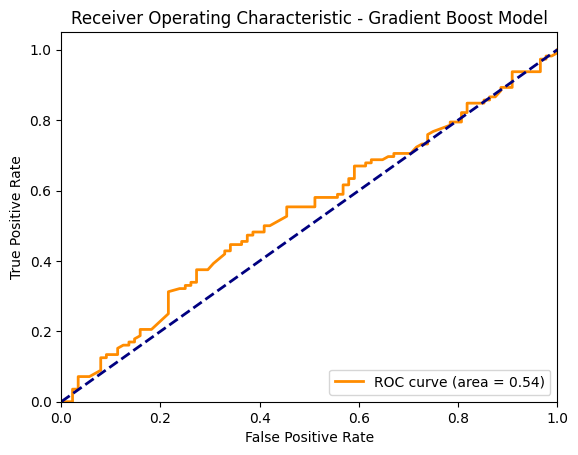

AUC for Gradient Boost Model: 0.5384537337662337


In [48]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Assuming 'High' is the positive label
y_test_binary = (y_test == 'High').astype(int)

# Get predicted probabilities for the positive class (High)
# Make sure 'best_gb' is the correct variable name for your Gradient Boosting model
y_pred_prob = best_gb.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area for Gradient Boosting model
fpr, tpr, _ = roc_curve(y_test_binary, y_pred_prob)
roc_auc = roc_auc_score(y_test_binary, y_pred_prob)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Gradient Boost Model')
plt.legend(loc="lower right")
plt.show()

# Print AUC
print("AUC for Gradient Boost Model:", roc_auc)

Feature Importance:


       Feature  Importance
1       income    0.904258
0       gender    0.073566
2  debt_status    0.022176


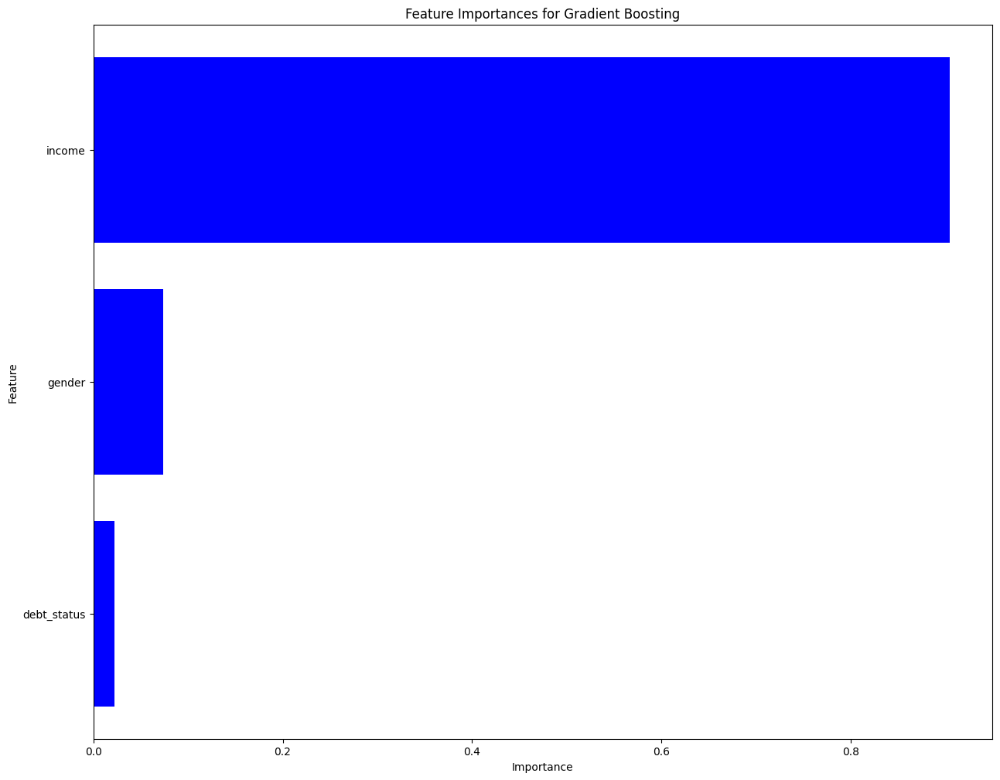

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import numpy as np

# Example DataFrames (assuming these are defined correctly)
# X_train and y_train should be your training data and target

# Set up preprocessing for categorical and numerical features
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns

# Preprocessing for numerical data: impute missing values
numerical_transformer = SimpleImputer(strategy='most_frequent')

# Preprocessing for categorical data: impute missing values and apply one-hot encoding
# Check if there are any categorical columns before creating the pipeline
if len(categorical_cols) > 0:
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ])

    # Bundle preprocessing for numerical and categorical data
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_cols),
            ('cat', categorical_transformer, categorical_cols)
        ])
else:
    # If no categorical columns, only use numerical transformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_cols)
        ])

# Create and fit the pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', GradientBoostingClassifier())
])

# Fit the model
pipeline.fit(X_train, y_train)

# Extract the model and preprocessor from the pipeline
model = pipeline.named_steps['classifier']
preprocessor = pipeline.named_steps['preprocessor']

# Get feature importances from the model
feature_importances = model.feature_importances_

# Extract feature names from the preprocessor
# Get one-hot encoded feature names
if len(categorical_cols) > 0:
    categorical_feature_names = pipeline.named_steps['preprocessor'].transformers_[1][1].named_steps['onehot'].get_feature_names_out()
    # Combine numerical feature names
    numerical_feature_names = pipeline.named_steps['preprocessor'].transformers_[0][1].get_feature_names_out()
    # Combine feature names
    feature_names = np.concatenate([numerical_feature_names, categorical_feature_names])
else:
    # If no categorical columns, use numerical feature names only
    feature_names = pipeline.named_steps['preprocessor'].transformers_[0][1].get_feature_names_out()

# Ensure that feature importances length matches feature names length
if len(feature_importances) != len(feature_names):
    raise ValueError("The number of feature importances does not match the number of feature names.")

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print feature importances
print(feature_importance_df)

# Plot feature importances
plt.figure(figsize=(15, 12))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='blue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances for Gradient Boosting')
plt.gca().invert_yaxis()  # To display the most important features at the top
plt.show()

Nodes in Gradient Boosting Classifier
as our the best fitting model is gradient boosting classifier


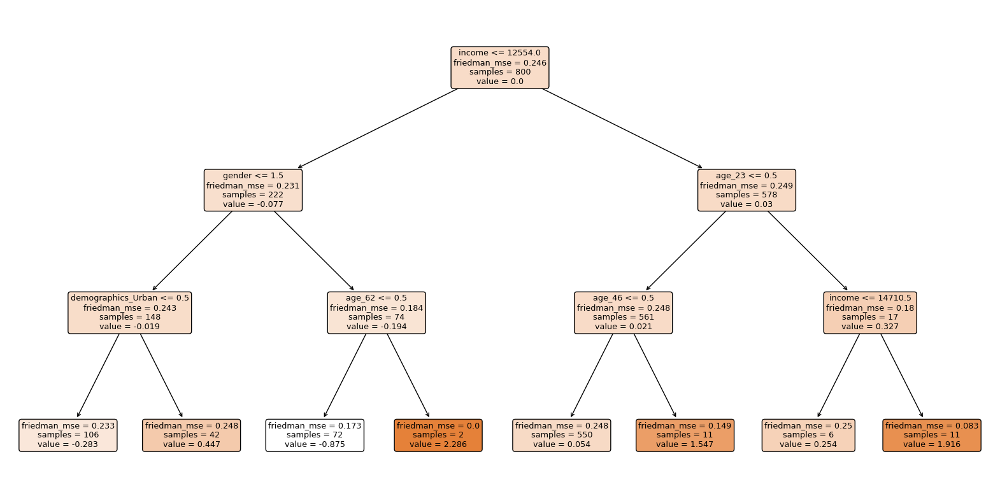

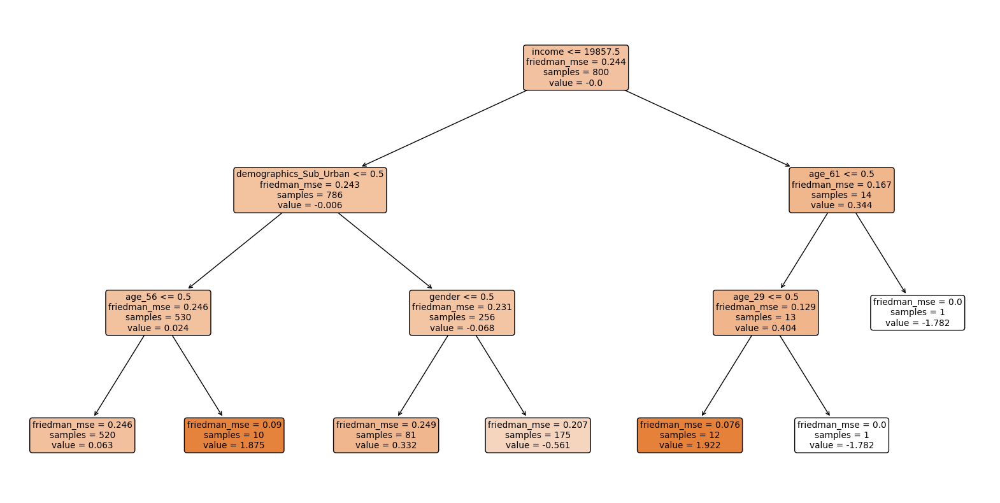

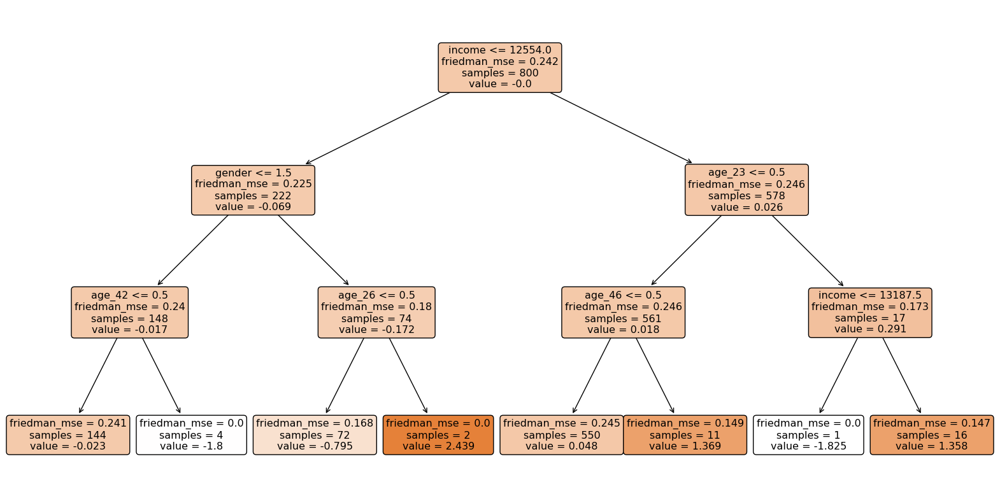

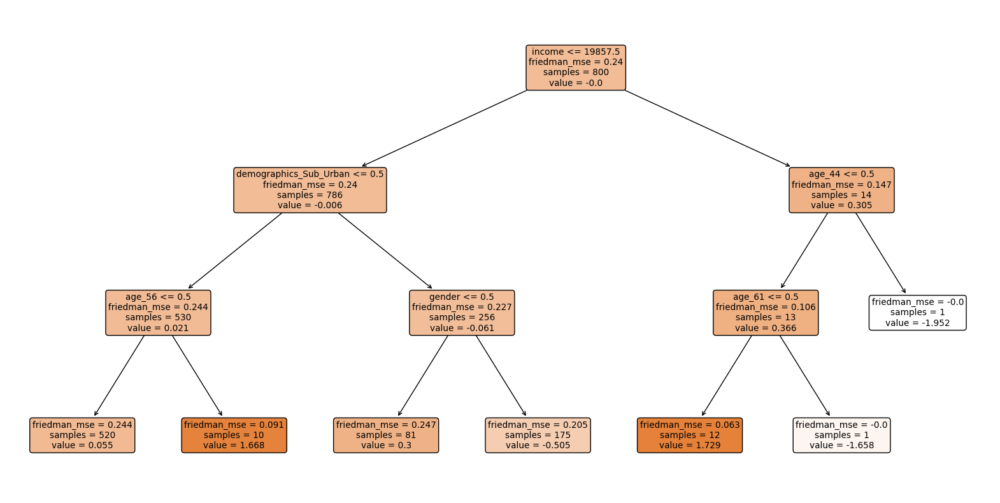

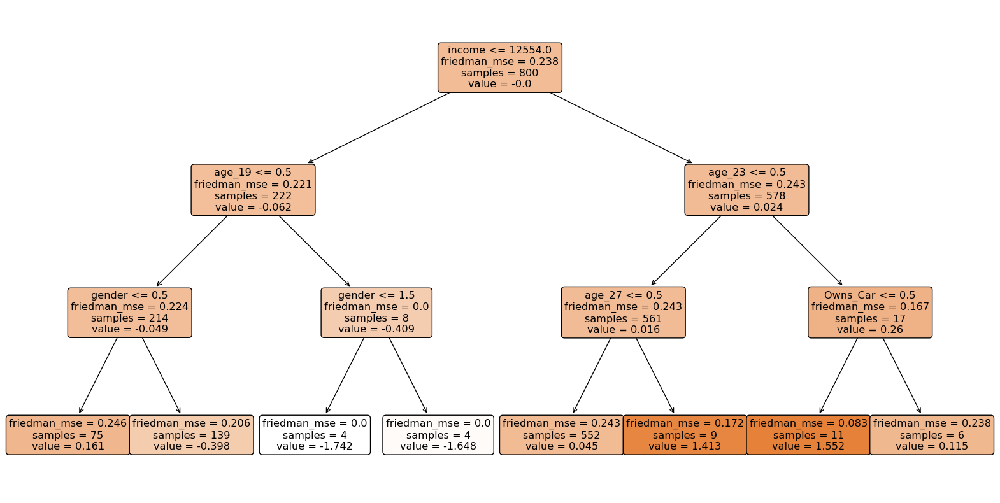

...

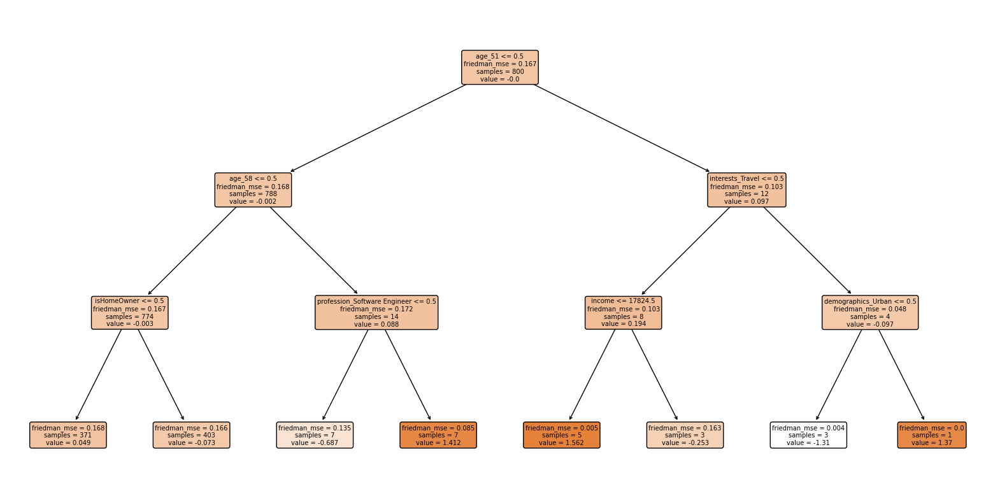

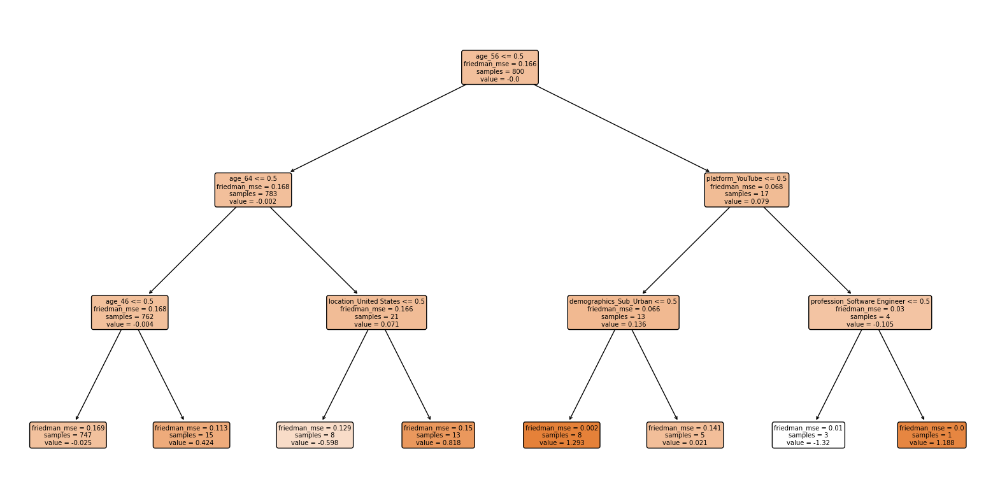

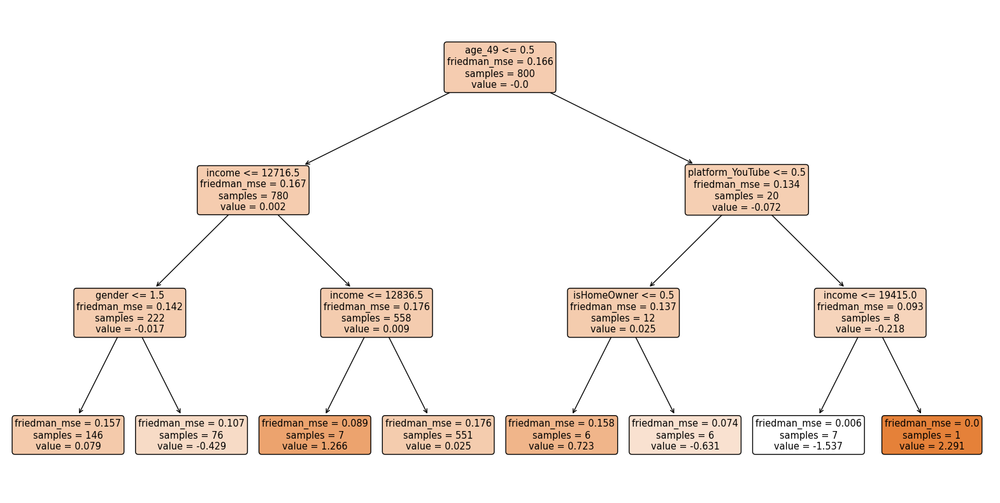

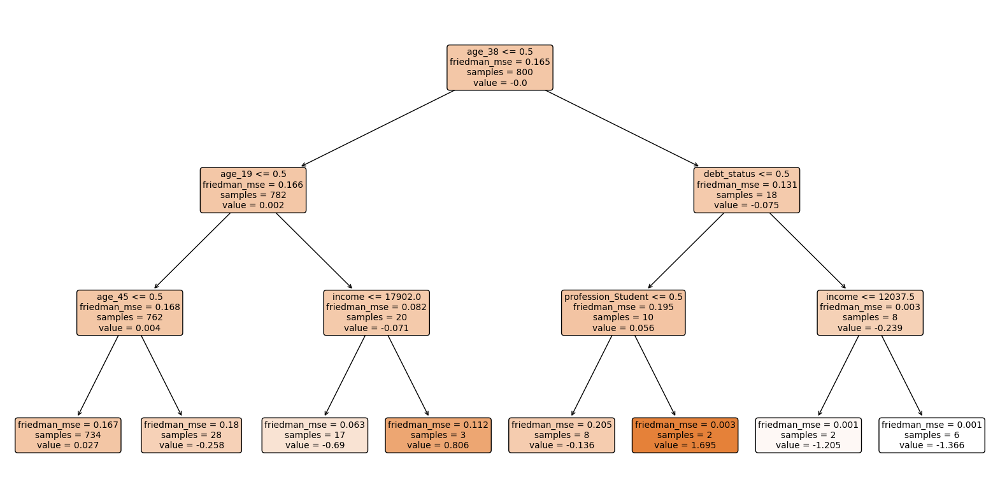

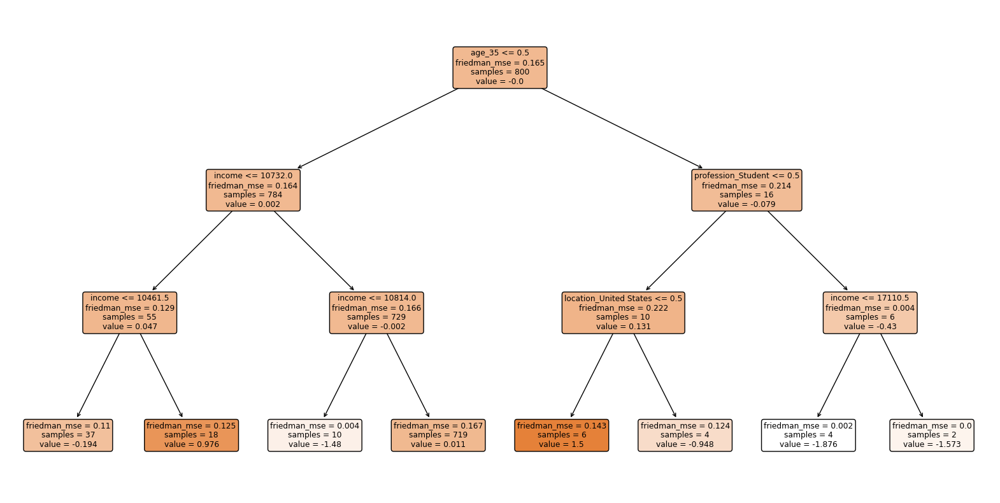

In [55]:
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
import matplotlib.pyplot as plt
import graphviz

# Fit the model
gradient_boost = GradientBoostingClassifier(n_estimators=100, max_depth=3)
gradient_boost.fit(X_train, y_train)

# Get the actual feature names used by the model
feature_names = X_train.columns  # Assuming X_train is a pandas DataFrame

# Access the individual trees
for i, est in enumerate(gradient_boost.estimators_):
    # Only one tree in each element of the list (as GradientBoosting uses weak learners)
    tree_in_est = est[0]

    # Export as dot file
    dot_data = export_graphviz(tree_in_est, out_file=None,
                               feature_names=feature_names, # Use the correct feature names
                               filled=True, rounded=True,
                               special_characters=True)

    # Render the graph using graphviz
    graph = graphviz.Source(dot_data)
    graph.render(f"tree_{i}")  # Saves the tree as tree_i.pdf

    # Alternatively, plot with matplotlib
    plt.figure(figsize=(20,10))
    tree.plot_tree(tree_in_est, filled=True, feature_names=feature_names, rounded=True) # Use the correct feature names
    plt.show()

# Ensure you have installed graphviz and its system binaries
# !pip install graphviz